<a href="https://colab.research.google.com/github/sexychoco/object_detection/blob/main/landmark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 경로 확인하기

In [17]:
import os

WORK_SPACE = "/object_detection"

if os.getcwd() == '/content' :
  # 구글 드라이브 사용 시 
  ROOT_PATH = "/content/drive/MyDrive" + WORK_SPACE 
else :
  ROOT_PATH = os.path.abspath('..')

### YOLOv5파일 다운로드 및 설치

In [18]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14421, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 14421 (delta 14), reused 19 (delta 8), pack-reused 14379
Receiving objects: 100% (14421/14421), 13.40 MiB | 8.25 MiB/s, done.
Resolving deltas: 100% (9964/9964), done.


In [20]:
%cd /content/yolov5 

/content/yolov5


In [21]:
%pwd

'/content/yolov5'

In [22]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 42.5 MB/s 


### 데이터 불러오기

In [23]:
%pwd

'/content/yolov5'

In [24]:
%cd ..

/content


In [25]:
!pip install roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="WBm0cn8kF5dWTC53pfAC")

project = rf.workspace("pelicane").project("crowd_images")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to crowd_images-2 in yolov5pytorch:: 100%|██████████| 3564/3564 [00:01<00:00, 2730.99it/s]


### 모델링을 위한 Train Data(학습)와 Test 데이터(검증) 확인

In [26]:
import glob

In [27]:
# DATA_PATH 지정하기 
DATA_PATH = "/content/crowd_images-2"
TRAIN_PATH = "/content/crowd_images-2/train"
VALIDATION_PATH = "/content/crowd_images-2/test"

train_image_list = glob.glob(TRAIN_PATH + "/images/*.jpg")
validation_image_list = glob.glob(VALIDATION_PATH + "/images/*.jpg")

In [28]:
print("학습 데이터(이미지) 개수 : " + str(len(train_image_list)))
print("검증 데이터(이미지) 개수 : " + str(len(validation_image_list)))

학습 데이터(이미지) 개수 : 1399
검증 데이터(이미지) 개수 : 122


### Yaml 파일 수정하기

In [29]:
import yaml

In [30]:
with open('/content/crowd_images-2/data.yaml', 'r') as f:
  data = yaml.load(f, Loader=yaml.FullLoader)

print(data)

{'names': ['people'], 'nc': 1, 'train': 'crowd_images-2/train/images', 'val': 'crowd_images-2/valid/images'}


### "data.yaml" 파일 내 train, test 경로 .txt 파일 경로로 변경 후 저장

In [31]:
with open(DATA_PATH + '/train.txt', 'w') as f:
    f.write('\n'.join(train_image_list) + '\n')

with open(DATA_PATH + '/validation.txt', 'w') as f:
    f.write('\n'.join(validation_image_list) + '\n')

In [32]:
data['train'] = DATA_PATH + '/train.txt'
data['val'] = DATA_PATH + '/validation.txt'

with open(DATA_PATH + '/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': ['people'], 'nc': 1, 'train': '/content/crowd_images-2/train.txt', 'val': '/content/crowd_images-2/validation.txt'}


### Yolov5 를 이용한 모델 학습

In [33]:
%pwd

'/content'

In [34]:
%cd yolov5

/content/yolov5


In [35]:
!python train.py --img 416 --batch 16 --epochs 10 --data /content/crowd_images-2/data.yaml --weights yolov5s.pt --name people_detection

train: weights=yolov5s.pt, cfg=, data=/content/crowd_images-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=people_detection, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, 

### 모델 성능 확인

In [51]:
%pwd

'/content/yolov5'

In [52]:
%cd /content

/content


In [53]:
TEST_IMAGE_PATH = "/content/data/test/images"

In [54]:
%cd /content/yolov5

/content/yolov5


In [55]:
!python detect.py --source '{TEST_IMAGE_PATH}' --weights /content/yolov5/runs/train/people_detection/weights/best.pt --img 416 --conf 0.3

detect: weights=['/content/yolov5/runs/train/people_detection/weights/best.pt'], source=/content/data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/data/test/images/1.jpg: 192x416 34 peoples, 13.8ms
image 2/3 /content/data/test/images/2.jpg: 288x416 28 peoples, 11.7ms
image 3/3 /content/data/test/images/3.jpg: 320x416 6 peoples, 11.1ms
Speed: 0.3ms pre-process, 12.2ms inference, 1.1ms NMS per image at shape (1, 3, 416, 416)
Results saved

### detect가 완료된 이미지

In [56]:
from PIL import Image               # to load images
from IPython.display import display # to display images

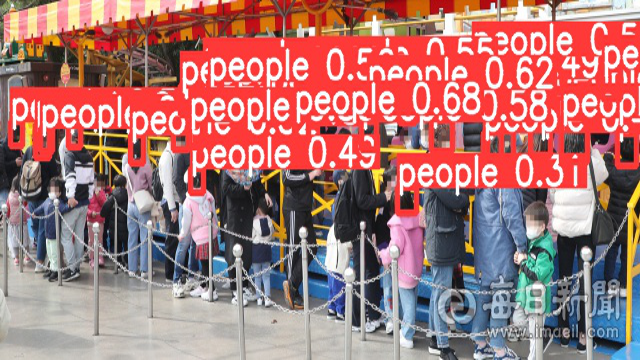

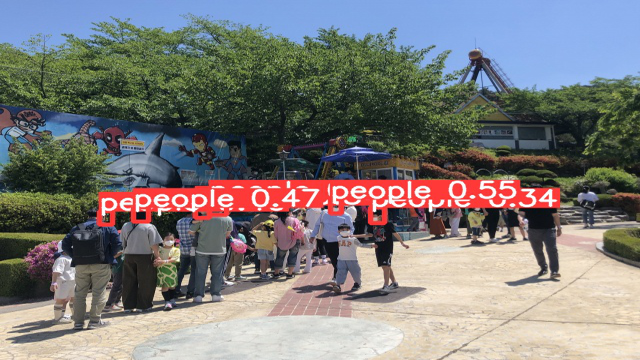

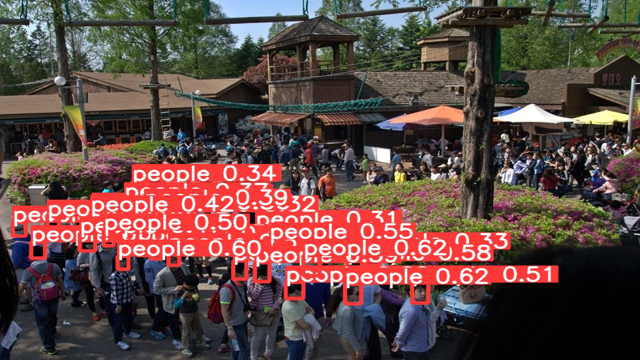

In [57]:
detect_image_path = "/content/yolov5/runs/detect/exp5"  #detect가 완료된 파일의 경로

for i in glob.glob(detect_image_path + '/*.jpg'):
  img = Image.open(i)
  img_resize = img.resize((640, 360))
  display(img_resize)
  print('\n')


### 비디오 테스트

In [58]:
TEST_VIDEO_PATH = "/content/data/test/video/videoplayback.mp4"

In [59]:
!python detect.py --source '{TEST_VIDEO_PATH}' --weights /content/yolov5/runs/train/people_detection/weights/best.pt --conf 0.3 --img 256

detect: weights=['/content/yolov5/runs/train/people_detection/weights/best.pt'], source=/content/data/test/video/videoplayback.mp4, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/3288) /content/data/test/video/videoplayback.mp4: 160x256 4 peoples, 11.1ms
video 1/1 (2/3288) /content/data/test/video/videoplayback.mp4: 160x256 4 peoples, 6.9ms
video 1/1 (3/3288) /content/data/test/video/videoplayback.mp4: 160x256 4 peoples, 7.0ms
video 1/1 (4/3288) /content/da

In [60]:
detect_video = '/content/yolov5/runs/detect/exp6/videoplayback.mp4' # 경로 수정

# 비디오 데이터 압축 (Colab에서 실행 목적)
def video_compressing(detect_video):  
  compressed_video = detect_video[:-4] + "_compressed.mp4"
  os.system(f"ffmpeg -i {detect_video} -vcodec libx264 {compressed_video}")

  return compressed_video 

In [61]:
compressed_video = video_compressing(detect_video)

from IPython.display import HTML
from base64 import b64encode

mp4 = open(compressed_video,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
    <source src="%s" type="video/mp4">
</video>
""" % data_url)